In [1]:
#imports
import numpy as np
import cv2
import glob 
import random
import scipy
import scipy.stats as st
import matplotlib.pyplot as plt
import pandas as pd
import skimage
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

import sklearn

# Foreword

This exercise was done as a three part exercise for the University of Turku course Machine Learning and Pattern Recognition in 2023. This is not representative of my current understanding of machine learning as that has improved from taking additional courses on the topic, but it does give a solid overview of some of the topics covered up to this point. Mistakes in parts 1 and 2 have been fixed based on course instructor feedback as to not affect the results in part 3.

# Part 1

## 1.1. Introduction

The purpose of this report is to experiment with feature extraction and visualisation and training and comparing the performance of different machine learning methods on the extracted data. The data used for feature extraction and training is a subset of a larger rice image dataset used by İ. Çınar and M. Koklu. in their paper "Identification of rice varities using machine learning algorithms" [1]. The dataset contains images of different rice species of which three are used in this report, Arborio, Basmati and Jasmine. The original dataset has 15 000 images per specie but this report only selects 100 random examples from each.

The workflow in this report is a smaller scale version of what is done in the İ. Çınar and M. Koklu paper. First, color and shape features are extracted from the images by finding the contours in each image. For color features the colour channel information of pixels inside these contours are evaluated using statistical methods. The data for shape features is collected by using properties of the contours fitted earlier and properties of an ellipse that is fitted to these contours. The collected features are then visualised with a collection of plotting methods to better understand which features would perform well in classification. Principal Component Analysis is then performed and visuaised to gain an understanding of how easy the classification task is likely to be. Finally model selection and evaluation are performed on three machine learning methods: k-Nearest Neighbour classification (k-NN), Random Forest classification (RF) and Multilayer Perceptron classification (MLP). To increase the reliability of the model selection and performance evaluation 5-fold repeated cross-validation is used for model selection and a nested cross-validation setup of 10-fold outer loop cross-validation and 5-fold inner loop repeated cross-validation is used performance evaluation.

The results show that shape features like roundness, calculated by using area and perimeter of the fitted ellipse, and aspect ratio, defined as the major axis length divided by the minor axis length of the fitted ellipse, are very good features for classifying these three rice species. In terms of classification k-NN and RF seem to perform equally well while MLP models lag behind the other models slightly in terms of accuracy.

[1] İ. Çınar and M. Koklu. Identification of rice varieties using machine learning algorithms. Journal of Agricultural Sciences, 28(2):307–325, 2022. doi: 10.15832/ankutbd.862482.

## 1.2. Preparations of the data

Perform preparations for the data
- take a random sample of 100 images from Arborio, Basmati and Jasmine rice species (i.e. 300 images in total) 
- determine the contour of each rice
- plot one example image of each rice species, including the contour 

In [2]:
#Preparations
#create file lists and add to "master" list
Arborio_images = glob.glob("../data/Arborio/*")
Basmati_images = glob.glob("../data/Basmati/*")
Jasmine_images = glob.glob("../data/Jasmine/*")
file_list = random.sample(Arborio_images,
                          100) + random.sample(Basmati_images,
                                               100) + random.sample(Jasmine_images,
                                                                    100)

#initialize input list
x = []

#for loop "master" file list, read each image and add to input list.
for file in file_list:
    image = cv2.imread(file)
    x.append(image)
    
#conver to numpy array and check shape
x = np.array(x)
x_ = x #save a copy of images
x.shape

(300, 250, 250, 3)

In [3]:
# find contour for each image
contour_list = []
ims_with_contours = []
for im in x:
    # take a copy of the original image in order to 
    # avoid adding the contour to the original image
    im = im.copy()
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE,
                                           cv2.CHAIN_APPROX_NONE)
    
    #save each created contour for later use
    contour_list.append(contours) 
    ims_with_contours.append(
        cv2.drawContours(im, contours, 0, (0,255,0), 3))

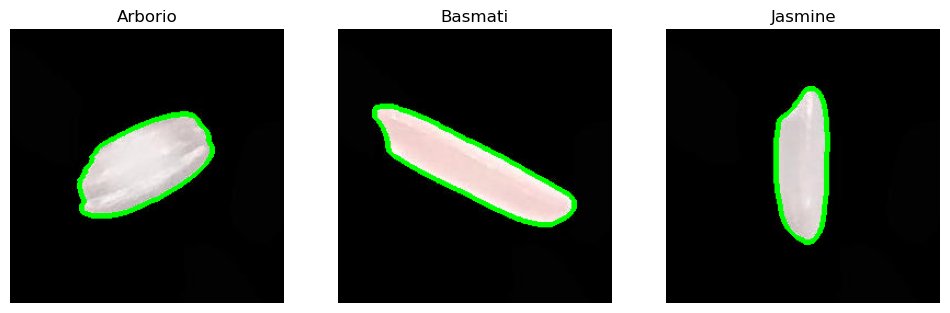

In [4]:
#plot the images for each rice species
plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.axis('off')
    
    # because the data tensor contains each specie
    # as a clump of 100 images we can simply take image
    # in index 0, 100 and 200
    # and they will correspond to the species Arborio,
    # Basmati and Jasmine respectively
    plt.imshow(ims_with_contours[i*100]) 
    if i == 0:
        plt.title("Arborio")
    if i == 1:
        plt.title("Basmati")
    if i == 2:
        plt.title("Jasmine")

## 1.3. Feature extraction

Gather the feature data <br>
<br>
Color features (15) <br>
- Calculate the following color features for each image, including only the pixels within the contour
    - Mean for each RGB color channel 
    - Variance for each RGB color channel 
    - Skewness for each RGB color channel 
    - Kurtosis for each RGB color channel 
    - Entropy for each RGB color channel 
    
Dimension features (6) <br>
- Fit an ellipse to the contour points
- Plot one example image of each rice species including the fitted ellipse 
- Calculate the following features for each image (for details, see the original article)
    - the major axis length the ellipse 
    - the minor axis length of the ellipse 
    - area inside the contour
    - perimeter of the contour
    - roundness 
    - aspect ratio 

### 1.3.1. Color Features

In [5]:
#create an empty array with colour feature shape (15 columns)
col_array = np.empty(shape = [0, 15])
percentage = 0

#loop the pictures and their indexes
for index, row in enumerate(x):
    
    channels = [] #empty list to save colour channel data
    
    #loop through each pixel in image
    for ax0 in range(np.size(row, 0)):
        for ax1 in range(np.size(row, 1)):
            
            #test if pixel is within the rice contour
            # and if so, add channel data to list
            if cv2.pointPolygonTest(contour_list[index][0],
                                    (ax1, ax0), False) == 1:
                channels.append(row[ax0, ax1, :])
    
    #convert to numpy array
    channels = np.array(channels)
    
    #create an placeholder row vector to save colour feature data into
    row_vector = np.ones(15)
    
    #create colour feature data
    #each row will be of the format Rmean, Gmean, Bmean,
    #Rvar, ... , Bentropy
    for i in range(3):
        row_vector[i] = np.mean(channels[:, i])
        row_vector[3+i] = np.var(channels[:, i])
        row_vector[6+i] = st.skew(channels[:, i])
        row_vector[9+i] = st.kurtosis(channels[:, i])
        row_vector[12+i] = st.entropy(channels[:, i])
    
    #add feature vector to the feature array
    col_array = np.append(col_array, [row_vector], axis = 0)

#finally check that the shape of the array is correct. Should output (300, 15)
col_array.shape

(300, 15)

### 1.3.2. Dimension Features

In [6]:
#setup sample ellipses for each rice specie
example_images = []
for i in range(3):
    im = x[i*100].copy()
    contour = contour_list[i*100][0]
    ellipse = cv2.fitEllipse(contour)
    example_images.append(cv2.ellipse(im, ellipse, (255, 0, 0), 3))


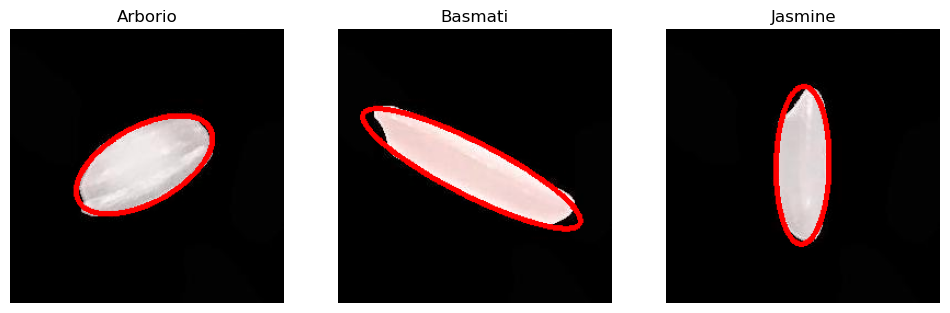

In [7]:
#Plot example pictures for each specie
plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.axis('off')
    plt.imshow(example_images[i])
    if i == 0:
        plt.title("Arborio")
    if i == 1:
        plt.title("Basmati")
    if i == 2:
        plt.title("Jasmine")

Source for roundness variable: https://stackoverflow.com/questions/29814229/how-to-calculate-the-value-of-the-roundness-shape-feature-of-an-image-contour

In [8]:
#create an empty array with dimension feature shape (6 columns)
dim_array = np.empty(shape = [0, 6])

#loop through contours
for contour in contour_list:
    
    #create an placeholder row vector to save dimension feature data into
    row_vector = np.ones(6)
    
    #create the ellipse based on contour data
    ellipse = cv2.fitEllipse(contour[0])
    
    #extract minor and major axis
    _, (minor_axis, major_axis), _ = ellipse
    row_vector[0] = major_axis
    row_vector[1] = minor_axis
    
    #Calculate contour area and arc length
    row_vector[2] = cv2.contourArea(contour[0])
    row_vector[3] = cv2.arcLength(contour[0], True)
    
    #calculate roundness
    row_vector[4] = 4*np.pi*row_vector[2]/(row_vector[3]**2)
    
    #calculate aspect ratio
    row_vector[5] = major_axis/minor_axis
    
    #save feature vector to feature array
    dim_array = np.append(dim_array, [row_vector], axis = 0)

#finally check that the shape of the array is correct. Should output (300, 6)
dim_array.shape

(300, 6)

### 1.3.3. Combine into Dataframe

In [9]:
#combine arrays and check that resulting array size is correct
features = np.concatenate((col_array, dim_array), axis = 1)
features.shape

(300, 21)

In [10]:
#create dataframe with column names from feature data
column_names = ["Rmean", "Gmean", "Bmean","Rvar", "Gvar", "Bvar",
                "Rskew", "Gskew", "Bskew", "Rkurt", "Gkurt", "Bkurt", 
                "Rentro", "Gentro", "Bentro", "Major_axis", "Minor_axis",
                "Area", "Arc_length", "Roundness", "Aspect_ratio"]
features = pd.DataFrame(features, columns = column_names)

#test output
features

,Rmean,Gmean,Bmean,Rvar,Gvar,Bvar,Rskew,Gskew,Bskew,Rkurt,...,Bkurt,Rentro,Gentro,Bentro,Major_axis,Minor_axis,Area,Arc_length,Roundness,Aspect_ratio
0,222.521207,214.515088,214.237519,242.005912,279.770840,268.358548,-0.637444,-0.489083,-0.509802,-0.316053,...,-0.652738,8.878100,8.877499,8.877617,137.015839,69.081734,7343.5,361.261974,0.707080,1.983387
1,212.673679,207.642035,207.121179,241.784740,258.345612,247.878160,-0.488934,-0.434955,-0.442893,-0.511491,...,-0.589470,8.621002,8.620676,8.620784,132.655487,55.730724,5704.0,329.078208,0.661898,2.380294
2,225.943011,230.149821,230.142115,415.535820,403.661066,406.031954,-0.962269,-1.116278,-1.087748,1.007257,...,1.384936,8.622731,8.622984,8.622964,113.319687,66.513145,5716.5,320.977703,0.697253,1.703719
3,214.213814,205.888811,203.681454,159.625349,180.439694,166.462757,-0.355804,-0.179316,-0.168725,0.092984,...,-0.258811,8.869329,8.868943,8.869067,137.595139,67.716255,7278.5,354.007140,0.729840,2.031937
4,212.695069,208.431115,209.176205,210.062450,222.263059,218.275438,-0.449939,-0.426359,-0.441529,-0.146125,...,-0.298457,8.862254,8.862015,8.862079,139.503342,67.658768,7227.5,359.747255,0.701783,2.061866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,248.906780,232.259953,219.589279,32.782993,62.503769,74.667729,-1.718741,0.526551,1.042768,5.014684,...,1.970787,8.531616,8.531308,8.531120,153.553940,44.600380,5215.5,351.688380,0.529895,3.442884
296,212.853586,196.973399,183.224303,75.035384,77.553453,96.070565,0.223744,0.516266,0.881159,2.768979,...,2.256092,8.454278,8.454111,8.453693,148.895294,43.770771,4849.0,347.563489,0.504422,3.401706
297,217.961118,212.756379,212.158769,80.308735,76.566611,79.995854,1.104500,1.103577,1.112131,1.934843,...,2.021514,8.503882,8.503882,8.503840,156.542938,43.703815,5095.0,344.994948,0.537933,3.581906
298,222.178367,212.964806,213.056200,98.048893,103.014977,103.959804,0.522046,0.783472,0.808054,0.850215,...,1.638415,8.598155,8.598018,8.598010,153.254623,47.650311,5569.0,351.445739,0.566592,3.216236


In [11]:
#create a specie list
specie = [None] * 300
for index in range(len(specie)):
    if index<100:
        specie[index] = "Arborio"
    elif index>199:
        specie[index] = "Jasmine"
    else:
        specie[index] = "Basmati"

#add specie list and filepath to feature data as new columns
features["specie"] = specie
features["filepath"] = file_list
#check output
features.shape

(300, 23)

In [12]:
#convert to csv file in the correct folder
features.to_csv('../training_data/rice_data.csv')  

# Part 2

## 2.1. Data exploration

- Standardize the data
- Plot a boxplot of each feature
- Plot histogram of each feature, use a different color for each class
- Plot pairplot (each feature against each feature and the label against each feature)
- Fit PCA using two components
- Plot the PCA figure with two components, color the data points according to their species
- How many PCA components are needed to cover 99% of the variance?

Source for Z-score standardization: #https://www.geeksforgeeks.org/how-to-standardize-data-in-a-pandas-dataframe/

In [13]:
#standardize data using z-score
features.iloc[:,:21] = (features.iloc[:,:21] - features.iloc[:,:21].mean()
                       ) / features.iloc[:,:21].std()
features.sample(10)

,Rmean,Gmean,Bmean,Rvar,Gvar,Bvar,Rskew,Gskew,Bskew,Rkurt,...,Gentro,Bentro,Major_axis,Minor_axis,Area,Arc_length,Roundness,Aspect_ratio,specie,filepath
0,-0.548436,-0.397820,-0.133706,1.391148,1.203119,1.116896,-0.125010,-0.486645,-0.706082,-0.731028,...,0.359318,0.360026,-0.921020,1.199243,0.256881,-0.575992,1.171277,-1.141559,Arborio,../data/Arborio\Arborio (4448).jpg
55,-1.203933,-0.230192,0.022287,0.657829,0.985464,0.915747,-0.506969,-1.207042,-1.434467,-0.386154,...,-0.356296,-0.355755,-1.050529,0.562631,-0.449098,-0.996763,1.117576,-0.999657,Arborio,../data/Arborio\Arborio (4940).jpg
97,0.584394,0.813751,1.240900,0.535833,0.494844,0.370493,-0.207576,-0.529396,-0.774121,-0.701963,...,0.873153,0.873925,-0.642551,1.532486,0.831836,-0.152431,1.018636,-1.112203,Arborio,../data/Arborio\Arborio (7260).jpg
231,1.831969,2.838684,1.291599,-1.369643,-1.719052,-1.601038,-4.098311,-3.469448,-0.221905,6.632876,...,1.745510,1.744909,0.870910,0.754457,1.952433,1.248866,-0.092837,-0.106103,Jasmine,../data/Jasmine\Jasmine (13380).jpg
120,0.762006,-0.363229,-0.028800,-0.169949,0.691866,0.565603,-0.857971,0.718815,0.530498,0.618544,...,0.640830,0.641703,0.784656,-0.341080,0.578969,0.903077,-0.731457,0.523689,Basmati,../data/Basmati\basmati (6424).jpg
161,0.386944,0.902376,0.069340,-0.634385,-0.364186,-0.103470,1.143944,0.798313,1.045621,-0.562402,...,0.720768,0.719072,1.009757,-0.383045,0.662316,1.004570,-0.778747,0.697046,Basmati,../data/Basmati\basmati (14740).jpg
43,0.740974,0.861403,1.320988,0.672942,0.611092,0.523121,-0.039326,-0.358777,-0.537060,-0.853963,...,0.779920,0.780584,-0.656813,1.348647,0.723767,-0.216433,1.019437,-1.065112,Arborio,../data/Arborio\Arborio (3113).jpg
134,1.301373,0.706604,0.868035,-1.107276,-1.078306,-0.978874,-1.076700,1.569176,1.613231,1.056281,...,0.127945,0.127499,0.563431,-0.489424,0.016728,0.351514,-0.556960,0.498844,Basmati,../data/Basmati\basmati (7832).jpg
267,-1.523309,-1.585936,-1.611898,-0.258733,-0.720061,-0.685604,0.586821,0.400665,0.488023,-0.402323,...,-1.516999,-1.517309,-0.377476,-1.209200,-1.395584,-0.891326,-0.371150,0.451366,Jasmine,../data/Jasmine\Jasmine (5458).jpg
67,-2.273230,-1.860328,-1.671893,1.221111,0.547837,0.521714,-0.338403,-0.815851,-1.056047,-0.544575,...,0.360347,0.360826,-0.950357,1.251778,0.259000,-0.528977,1.081280,-1.170296,Arborio,../data/Arborio\Arborio (13602).jpg


Text(0.5, 1.0, 'Boxplot of each variable')

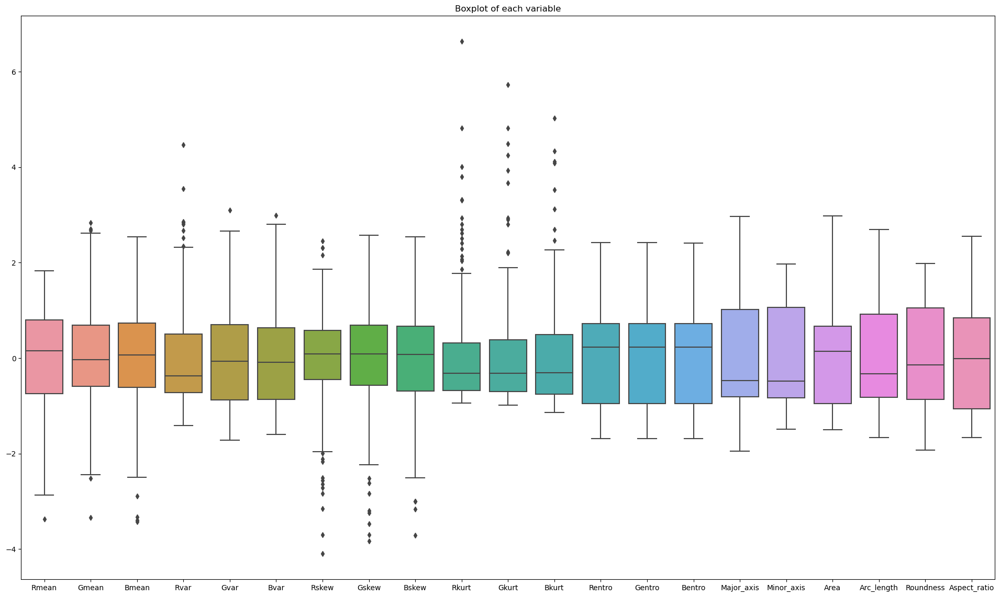

In [14]:
plt.figure(figsize=(24, 14))
sns.boxplot(data=features)
plt.title("Boxplot of each variable")

Text(0.5, 1.0, 'Histogram for each variable')

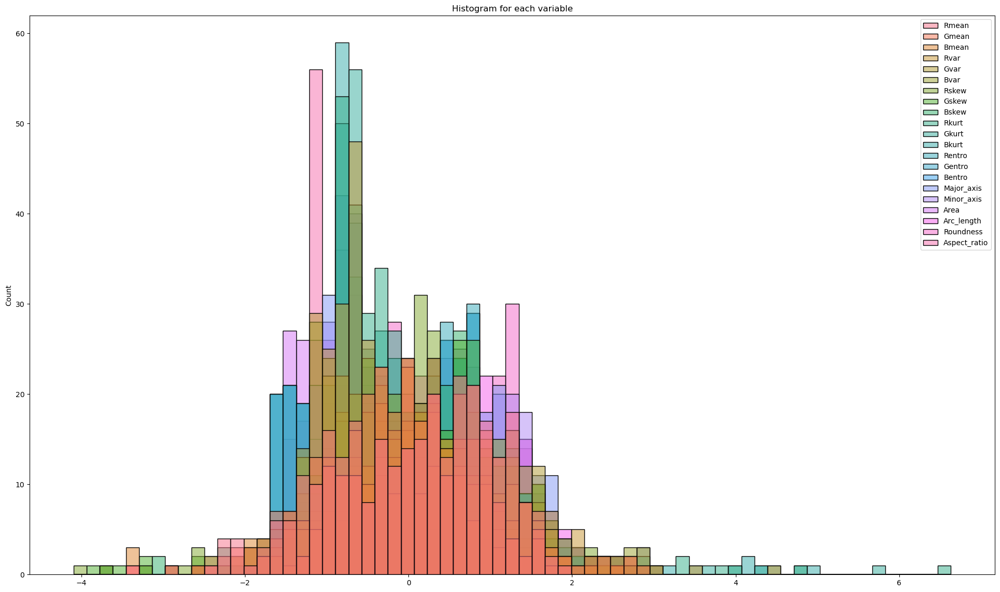

In [15]:
plt.figure(figsize=(24, 14))
sns.histplot(data=features)
plt.title("Histogram for each variable")

C:\Users\joona\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


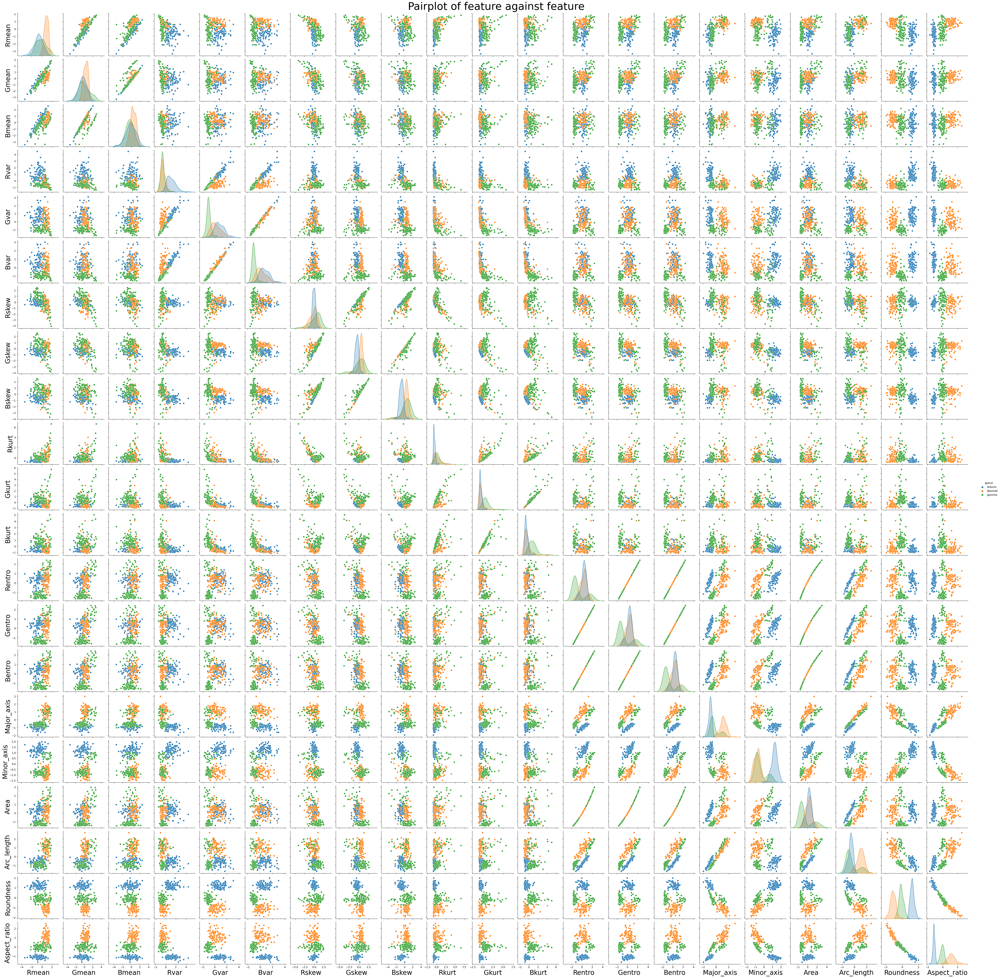

In [16]:
plt.rc('axes', labelsize=25)
p = sns.pairplot(data=features, hue = 'specie')
p.fig.suptitle("Pairplot of feature against feature",y = 1,
               fontsize = 40)

plt.show()

As can be seen from the distribution plot for the roundness and aspect ratio variables (the two last rows), the classwise distributions seem to be very well separated. I would wager that these two are very important features for classification. The rest of the features don't really come even close to the same level of separation.

### 2.1.1. PCA

In [17]:
#https://www.datacamp.com/tutorial/principal-component-analysis-in-python
pca = PCA(n_components=2)
components = pca.fit_transform(features.iloc[:,:21])

#convert pca data to dataframe, add target values and print out a sample
pca_df = pd.DataFrame(data = components
             , columns = ['PC1', 'PC2'])
pca_df['Specie'] = features['specie']
pca_df.sample(10)

,PC1,PC2,Specie
188,-0.957261,-0.449171,Basmati
192,4.661602,-0.323235,Basmati
46,1.516385,3.554586,Arborio
27,1.120375,2.606683,Arborio
190,1.888472,-0.839316,Basmati
144,-1.271240,-1.463668,Basmati
101,-0.810311,0.438301,Basmati
178,2.019638,-2.715678,Basmati
36,1.249826,2.056502,Arborio
100,2.147490,-2.704545,Basmati


Text(0.5, 1.0, 'Scatterplot for principal components 1 and 2')

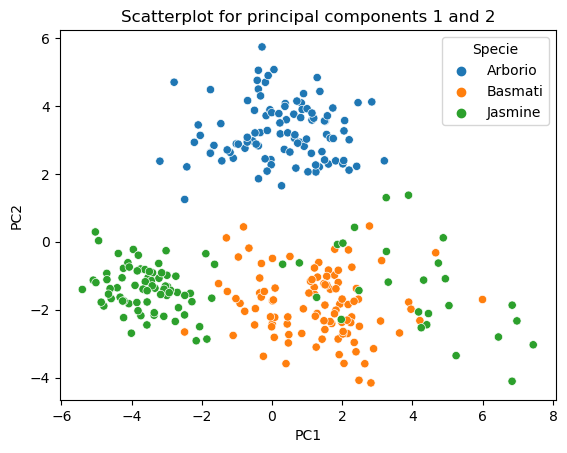

In [18]:
plt.rc('axes', labelsize=10)
sns.scatterplot(data = pca_df, x = 'PC1', y = 'PC2', hue = 'Specie')
plt.title("Scatterplot for principal components 1 and 2")

Arborio is clearly separable from basmati and jasmine, so I believe classifying arborio samples will be quite easy. Most jasmine samples are separated quite well from basmati samples, but some jasmine samples look statistically more like basmati samples. This PCA looks eerily similar to the classic Iris dataset. I belive this dataset data will most likely lead to a quite strong prediction performance.

In [19]:
pca_99 = PCA(0.99)
components_99 = pca_99.fit_transform(features.iloc[:,:21])
pca99_df = pd.DataFrame(data = components_99)
print("Number of components required for 99% variance:", pca99_df.shape[1])

Number of components required for 99% variance: 9


## 2.2. Model selection

Select the best model for each classifier. Use 5-fold repeated cross validation with 3 repetitions. You can choose the hyperparameter ranges to use. <br>

- k Nearest Neighbors classifier: hyperparameter k
- random forest: hyperparameters max_depth and max_features
- MLP: use one hidden layer and Early stopping. Hyperparameters:
    - number of neurons in the hidden layer
    - activation function: logistic sigmoid function and rectified linear unit function
    - solver: stochastic gradient descent and adam
    - validation_fraction: 0.1 and 0.5

For each classifier:
- Report the best hyperparameter or the best combination of hyperparameters. <br>
- Plot the accuracy versus the hyperparameter/hyperparameter combination and highlight the best value. <br>

In [20]:
#add a new column of string target values converted
#to integer types and set new colum to categorical
features['specie_int']= features['specie'].map({'Arborio':0,
                                                'Basmati':1,
                                                'Jasmine':2}).astype('category')

#copy to a new dataframe
data = features

#make sure new column works
features.sample(10)

,Rmean,Gmean,Bmean,Rvar,Gvar,Bvar,Rskew,Gskew,Bskew,Rkurt,...,Bentro,Major_axis,Minor_axis,Area,Arc_length,Roundness,Aspect_ratio,specie,filepath,specie_int
243,-0.150139,-0.313831,0.048702,-1.055488,-1.443991,-1.444733,1.509904,1.531453,1.617922,0.327346,...,-1.416656,-0.403007,-1.035707,-1.311883,-0.963946,-0.138993,0.279306,Jasmine,../data/Jasmine\Jasmine (3034).jpg,2
283,-1.019528,-0.902517,-0.695036,-0.754150,-1.149352,-1.202158,0.629563,-0.036032,-0.031109,0.430185,...,-1.140079,-0.285343,-0.902537,-1.099630,-0.627680,-0.397153,0.254822,Jasmine,../data/Jasmine\Jasmine (5924).jpg,2
194,0.965428,0.846760,1.181184,-0.605303,0.384602,0.395967,0.145592,0.227384,0.115034,-0.235738,...,0.384115,0.871618,-0.631435,0.293964,0.775803,-0.819322,0.818349,Basmati,../data/Basmati\basmati (12005).jpg,1
276,-1.104528,-1.704714,-1.831044,-0.492452,-0.831284,-0.780647,1.591352,1.202574,1.534994,0.199951,...,-1.144459,-0.582904,-0.698479,-1.112697,-0.806518,-0.132871,-0.101765,Jasmine,../data/Jasmine\Jasmine (1189).jpg,2
240,0.234930,0.877215,-1.296949,-0.700512,-1.150243,-1.145520,0.440605,0.101893,0.176002,-0.271903,...,0.868846,0.904816,-0.278976,0.845610,0.871467,-0.481535,0.550474,Jasmine,../data/Jasmine\Jasmine (14339).jpg,2
49,0.583703,1.113155,1.662027,0.304001,0.364014,0.265821,-0.326558,-0.814331,-1.035656,-0.591221,...,0.322180,-0.949633,1.307467,0.214148,-0.649215,1.266515,-1.185765,Arborio,../data/Arborio\Arborio (10478).jpg,0
190,1.282453,0.532535,0.776251,-0.907066,1.602861,1.641195,-0.032855,0.584302,0.502541,-0.402386,...,0.517990,1.184524,-0.561700,0.463837,0.902224,-0.822233,0.961758,Basmati,../data/Basmati\basmati (8748).jpg,1
7,-0.176321,0.200250,0.648901,1.588654,1.178893,1.147310,0.205436,-0.237495,-0.418198,-0.899854,...,0.683962,-0.828373,1.487452,0.612873,-0.388963,1.222296,-1.181405,Arborio,../data/Arborio\Arborio (5543).jpg,0
205,0.569921,-1.167201,-3.394956,-0.919565,-1.429812,-1.452236,-1.479422,-1.535311,0.596219,2.409439,...,-1.669346,-1.016107,-0.625358,-1.501180,-1.437009,0.453542,-0.437479,Jasmine,../data/Jasmine\Jasmine (3428).jpg,2
11,-2.218025,-1.934446,-1.880321,1.195794,0.743741,0.755581,0.370084,-0.124052,-0.276557,-0.753848,...,0.073617,-0.859584,0.765748,-0.037306,-0.589762,0.840387,-0.973888,Arborio,../data/Arborio\Arborio (12136).jpg,0


In [21]:
#initialize validator
RKF = sklearn.model_selection.RepeatedKFold(n_repeats = 3,
                                            random_state = 42341)

### 2.2.1 k-NN Model Selection

In [22]:
# dataframe for saving data for plotting and
# two variables for finding best performing model
plotting_df_knn = pd.DataFrame(columns = ['Accuracy', 'k']) 
best_acc = 0
best_k = 0

#k values of 1,..,25
for k in range(1, 26):
    
    #accuracy list for saving splitwise accuracies
    accuracies = []
    
    #initialize classifier with correct k value
    kNN = KNeighborsClassifier(n_neighbors = k)
    
    #train test split with validator
    for train_index, test_index in RKF.split(data):
        
        #set training and test samples
        train = data.loc[train_index]
        test = data.loc[test_index]
        
        train_x = train.iloc[:,:21]
        train_y = train.iloc[:,23]
        test_x = test.iloc[:,:21]
        test_y = test.iloc[:,23]
        
        #fit model and obtain classification results
        kNN.fit(train_x.values, train_y.values)
        accuracies.append(kNN.score(test_x.values, test_y.values))
        
    #find average accuracy for RKF splits
    acc = np.mean(accuracies)
    
    #add hyperparameter values and accuracy to plotting dataframe
    plotting_df_knn = pd.concat([plotting_df_knn, pd.DataFrame.from_records
                                 ([{ 'Accuracy': acc, 'k': k }])],
                                ignore_index = True)
    
    #check if best accuracy
    if acc > best_acc:
        best_acc = acc
        best_k = k

#print out best hyperparameter/parameter combinations
print("\nBest model accuracy", best_acc, "with k value", best_k)


Best model accuracy 0.9833333333333331 with k value 1


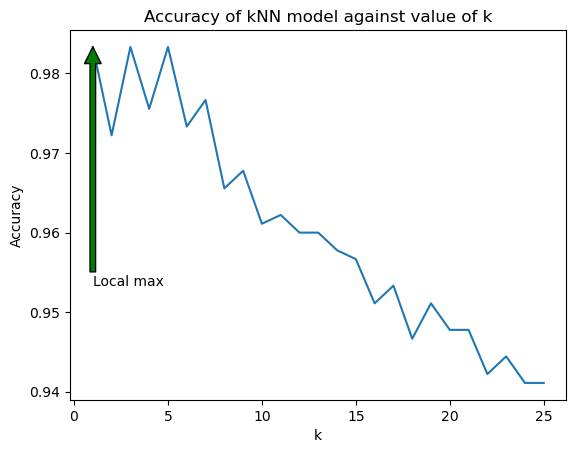

In [23]:
ax = sns.lineplot(data = plotting_df_knn, x = 'k', y = 'Accuracy')

#find x/y position of maximum value datapoint
ymax = max(plotting_df_knn['Accuracy'])
xmax = plotting_df_knn.iloc[plotting_df_knn['Accuracy'].idxmax(), 1]

#add arrow lable
ax.annotate('Local max', xy=(xmax, ymax), xytext=(xmax, ymax-0.03),
            arrowprops=dict(facecolor='green'),)

ax.set_title('Accuracy of kNN model against value of k')
ax.set(xlabel='k', ylabel= 'Accuracy');


### 2.2.2. Random Forest Model Selection

In [24]:
#random forest

#follows the same format as k-nn block,
#but instead for-loop both hyperparameters
plotting_df_forest = pd.DataFrame(columns = ['Accuracy',
                                             'depth',
                                             'features']) 
best_acc = 0
best_depth = 0
best_features = 0
for depth in range(1, 15):
    for features in range(1, 22):
        accuracies = []
        
        forest = RandomForestClassifier(max_depth = depth,
                                        max_features = features)
        
        for train_index, test_index in RKF.split(data):
            
            train = data.loc[train_index]
            test = data.loc[test_index]
        
            train_x = train.iloc[:,:21]
            train_y = train.iloc[:,23]
            test_x = test.iloc[:,:21]
            test_y = test.iloc[:,23]
        
            forest.fit(train_x, train_y)
            accuracies.append(forest.score(test_x, test_y))
        
        acc = np.mean(accuracies)
        plotting_df_forest = pd.concat([plotting_df_forest,
                                        pd.DataFrame.from_records(
                                        [{'Accuracy': acc,
                                          'depth': depth,
                                          'features': features}])],
                                       ignore_index = True)
        if acc > best_acc:
            best_acc = acc
            best_features = features
            best_depth = depth

print("\nBest model accuracy", best_acc,
      "with depth value", best_depth,
      "and", best_features, "features")


Best model accuracy 0.9866666666666666 with depth value 9 and 2 features


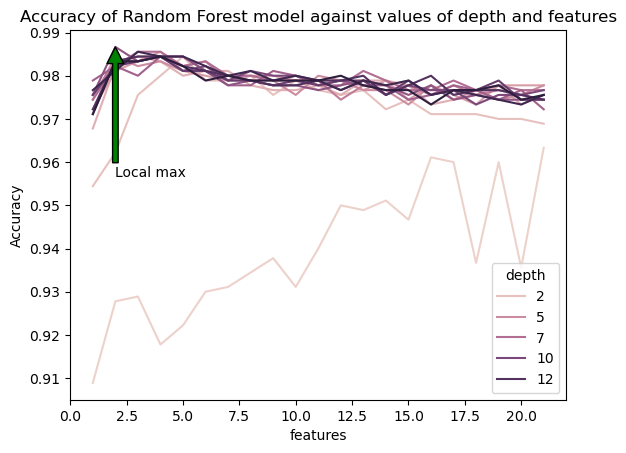

In [25]:
ax = sns.lineplot(data = plotting_df_forest, x = 'features',
                  y = 'Accuracy', hue = 'depth')

ymax = max(plotting_df_forest['Accuracy'])
xmax = plotting_df_forest.iloc[plotting_df_forest['Accuracy'].idxmax(), 2]

ax.annotate('Local max', xy=(xmax, ymax),
            xytext=(xmax, ymax-0.03),
            arrowprops=dict(facecolor='green'),)

ax.set_title('Accuracy of Random Forest model against values of depth and features')
ax.set(xlabel='features', ylabel= 'Accuracy');


#### 2.2.2.1. Feature importances for Random Forest

Source for feature importance calculation: https://stackoverflow.com/questions/42128545/how-to-print-the-order-of-important-features-in-random-forest-regression-using-p


In [26]:
important_features_dict = {}
for idx, val in enumerate(forest.feature_importances_):
    important_features_dict[idx] = val

important_features_list = sorted(important_features_dict,
                                 key=important_features_dict.get,
                                 reverse=True)

print(f'5 most important features: {important_features_list[:5]}')
print("Values for respective features:",
      forest.feature_importances_[important_features_list[:5]])

5 most important features: [20, 19, 4, 2, 5]
Values for respective features: [0.50699569 0.43850657 0.00943613 0.00941696 0.00604315]


As I suspected roundness (19) and aspect ratio (20) are the most important features and very close to each other in importance. The rest aren't really anywhere close to the importance of roundness and aspect ratio. I think my prediction that roundness and aspect ratio are the most important features is still spot on, at least in the context of random forests.

### 2.2.3. Multilayer Perceptron Model Selection

In [27]:
#multilayer perceptron

#follows the same format as k-nn block,
#but instead for loop each hyperparameter
plotting_df_mlp = pd.DataFrame(columns = ['Accuracy',
                                          'neurons',
                                          'type']) 
best_acc = 0
best_neurons = 0
best_activation = ''
best_solver = ''
best_fraction = 0
for neurons in range(10, 60):
    model_type = 0
    for activation in ['logistic', 'relu']:
        for solver in ['sgd', 'adam']:
            for fraction in [0.1, 0.5]:
                
                accuracies = []
                MLP = MLPClassifier(hidden_layer_sizes = neurons,
                                    activation = activation,
                                    solver = solver,
                                    validation_fraction = fraction,
                                    max_iter = 500,
                                    early_stopping = True)
                
                for train_index, test_index in RKF.split(data):
                    accuracy = 0
                
                    train = data.loc[train_index]
                    test = data.loc[test_index]
                    
                    train_x = train.iloc[:,:21]
                    train_y = train.iloc[:,23]
                    test_x = test.iloc[:,:21]
                    test_y = test.iloc[:,23]

                    MLP.fit(train_x.values, train_y.values)
                    accuracies.append(MLP.score(test_x.values,
                                                test_y.values))
                
                acc = np.mean(accuracies)
                plotting_df_mlp = pd.concat([plotting_df_mlp, 
                                                pd.DataFrame.from_records(
                                                    [{'Accuracy': acc, 
                                                      'neurons': neurons, 
                                                      'type': model_type}])], 
                                               ignore_index = True) 
                model_type += 1
                if acc > best_acc:
                    best_acc = acc
                    best_neurons = neurons
                    best_activation = activation
                    best_solver = solver
                    best_fraction = fraction
                    
print("\nBest model accuracy", best_acc, "with",
      best_neurons, "neurons,",
      best_activation, "activation,", 
      best_solver, "solver and", 
      best_fraction, "fraction")


Best model accuracy 0.9488888888888887 with 58 neurons, relu activation, adam solver and 0.5 fraction


#### 2.2.3.1. MLP model types legend
- type 0: logistic, sgd, 0.1
- type 1: logistic, sgd, 0.5
- type 2: logistic, adam, 0.1
- type 3: logistic, adam, 0.5
- type 4: relu, sgd, 0.1
- type 5: relu, sgd, 0.5
- type 6: relu, adam, 0.1
- type 7: relu, adam, 0.5

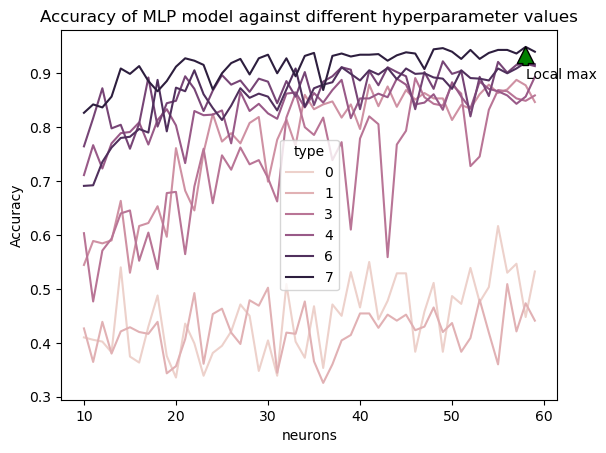

In [28]:
ax = sns.lineplot(data = plotting_df_mlp, x = 'neurons',
                  y = 'Accuracy', hue = 'type')

ymax = max(plotting_df_mlp['Accuracy'])
xmax = plotting_df_mlp.iloc[plotting_df_mlp['Accuracy'].idxmax(), 1]

ax.annotate('Local max', xy=(xmax, ymax), xytext=(xmax, ymax-0.06),
            arrowprops=dict(facecolor='green'),)

ax.set_title('Accuracy of MLP model against different hyperparameter values')
ax.set(xlabel='neurons', ylabel= 'Accuracy');


### 2.2.4 Discussion of model selection

I'm not 100% confident in the results I've gotten from the model selection. Knowing that neighbour methods are very suceptible to noise, especially when the value of k is small, I do not quite trust this high of a classification accuracy. In this context I can believe it to be possible given how high quality the original images were. There might just be very very little noise in the data. However this doesn't make me confident in the models' ability to classify outside of these very high quality images.

I know very little about random forests as a machine learning method but I have been conditioned to be suspicious whenever misclassification rate is sub 1%. It might be possible, especially given the quality of the data, but again that makes the classification easier and the results aren't really representative of real world contexts where the data contains more noise.

I ran the MLP model multiple times and gathered that all models with under 10 neurons were very sub par so I chose to not include them in the rest of the runs.

# Part 3

## 3.1. Performance estimation

Use the previously gathered data (again, use the standardized features). <br>
Estimate the performance of each model using nested cross validation. Use 10-fold cross validation for outer and <br>
5-fold repeated cross validation with 3 repetitions for inner loop.  <br> 
Select the best model in the inner loop using the hyperparameter combinations and ranges defined in the Part 2. <br>
For each model, calculate the accuracy and the confusion matrix. <br> 
Which hyperparameter/hyperparameter combination is most often chosen as the best one for each classifier? 

In [29]:
#Read in data
#I had an extra starting column in the csv data file so I drop it here
df = pd.read_csv('../training_data/rice_data.csv', usecols=range(1,24))
df.iloc[:,:21] = (df.iloc[:,:21] - df.iloc[:,:21].mean()) / df.iloc[:,:21].std()

In [30]:
df['specie_int']= df['specie'].map({'Arborio':0,
                                    'Basmati':1,
                                    'Jasmine':2}).astype('category')
df.sample(4)

,Rmean,Gmean,Bmean,Rvar,Gvar,Bvar,Rskew,Gskew,Bskew,Rkurt,...,Bentro,Major_axis,Minor_axis,Area,Arc_length,Roundness,Aspect_ratio,specie,filepath,specie_int
8,-1.257925,-0.932216,-0.766216,0.395094,0.048044,-0.004366,-0.244066,-0.790964,-0.995934,-0.431200,...,-0.219146,-0.948249,0.579985,-0.323018,-0.970982,1.237419,-0.953086,Arborio,../data/Arborio\Arborio (1533).jpg,0
23,-1.060205,-1.183989,-0.947180,0.129614,-0.408780,-0.454798,-0.103531,-0.546254,-0.711017,-0.382433,...,0.559006,-0.825701,1.367511,0.464896,-0.481234,1.231766,-1.146722,Arborio,../data/Arborio\Arborio (11435).jpg,0
108,0.036669,0.174201,0.066776,0.038531,0.951266,1.300977,0.760808,0.600564,0.530833,-0.606055,...,0.213795,0.966440,-0.758997,0.134333,0.689413,-0.855265,0.999770,Basmati,../data/Basmati\basmati (5683).jpg,1
129,1.029313,0.749900,1.320855,-0.853143,-0.502468,-0.625447,0.187759,0.670362,0.632592,-0.451884,...,1.378721,1.758378,-0.331580,1.470007,1.769371,-0.989794,1.119480,Basmati,../data/Basmati\basmati (9997).jpg,1


In [31]:
#Initialize cross validators
KF = sklearn.model_selection.KFold(n_splits=10,
                                   shuffle = True,
                                   random_state = 14325)
RKF = sklearn.model_selection.RepeatedKFold(n_repeats = 3)

### 3.1.1. k-NN Performance Estimation

In [32]:
outer_acc = []
k_counter = pd.DataFrame(columns = ['k']) #Dataframe for parameter combinations

#first CV split
for train_out, test_out in KF.split(df):
    
    #variables for tracking best performing model
    best_acc = 0
    best_k = 0

    #k values of 1,..,25
    for k in range(1, 26):

        #accuracy list for saving splitwise accuracies
        accuracies = []

        #initialize classifier with correct k value
        kNN = KNeighborsClassifier(n_neighbors = k)

        #train test split with validator
        for train_index, valid_index in RKF.split(train_out):

            #set training and test samples
            train_data = df.loc[train_index]
            valid_data = df.loc[valid_index]

            train_x = train_data.iloc[:,:21]
            train_y = train_data['specie_int']
            test_x = valid_data.iloc[:,:21]
            test_y = valid_data["specie_int"]

            #fit model and obtain classification results
            kNN.fit(train_x.values, train_y.values)
            accuracies.append(kNN.score(test_x.values, test_y.values))

        #find average accuracy for RKF splits
        acc = np.mean(accuracies)

        #check if best accuracy and if so, update best performing hyperparameters
        if acc > best_acc:
            best_acc = acc
            best_k = k

    #print out best hyperparameter/parameter combinations
    print("\nBest model accuracy in inner loop", best_acc,
          "with k value", best_k)
    #Add hyperparamenter combination to dataframe
    k_counter = pd.concat([k_counter, 
                           pd.DataFrame.from_records([{ 'k': best_k }])],
                          ignore_index = True)

    #sort train/test data
    train_data = df.loc[train_out]
    test_data = df.loc[test_out]

    train_x = train_data.iloc[:,:21]
    train_y = train_data['specie_int']
    test_x = test_data.iloc[:,:21]
    test_y = test_data["specie_int"]
    
    #initialize classifier with correct k value,
    #train it and print out accuracy and confusion matrix
    print("\n")
    print("Evaluating new classifier with k =", best_k)
    kNN = KNeighborsClassifier(n_neighbors = best_k)
    kNN.fit(train_x.values, train_y.values)
    score = kNN.score(test_x.values, test_y.values)
    print("Accuracy on test set:", score)
    outer_acc.append(score)
    predictions = kNN.predict(test_x.values)
    print("Confusion matrix:\n",
          sklearn.metrics.confusion_matrix(test_y, predictions), "\n")



Best model accuracy in inner loop 0.9839506172839505 with k value 1


Evaluating new classifier with k = 1
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[10  0  0]
 [ 0 13  1]
 [ 0  0  6]] 


Best model accuracy in inner loop 0.9827160493827161 with k value 1


Evaluating new classifier with k = 1
Accuracy on test set: 1.0
Confusion matrix:
 [[ 8  0  0]
 [ 0  8  0]
 [ 0  0 14]] 


Best model accuracy in inner loop 0.9814814814814814 with k value 1


Evaluating new classifier with k = 1
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[ 9  0  0]
 [ 0 13  1]
 [ 0  0  7]] 


Best model accuracy in inner loop 0.9790123456790123 with k value 1


Evaluating new classifier with k = 1
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[ 9  0  0]
 [ 0  7  1]
 [ 0  0 13]] 


Best model accuracy in inner loop 0.9777777777777777 with k value 3


Evaluating new classifier with k = 3
Accuracy on test set: 1.0
Confusion matrix:
 [[ 7  0  0]
 [ 0 16  0]
 [ 0  0  7

In [33]:
#Print out average accuracy over all outer splits and hyperparameter frequencies
print("Mean accuracy for nested cross validation:", np.mean(outer_acc))

print("Frequency of best hyperparameters\n", k_counter.value_counts())

Mean accuracy for nested cross validation: 0.9866666666666667
Frequency of best hyperparameters
 k
1    9
3    1
Name: count, dtype: int64


### 3.1.2. Random Forest Performance Estimation

In [34]:
outer_acc = []
forest_counter = pd.DataFrame(columns = ['depth', 'features'])
#First CV split
for train_out, test_out in KF.split(df):
    
    #variables for tracking best performing model
    best_acc = 0
    best_depth = 0
    best_features = 0
    
    #Loop through hyperparameter ranges
    for depth in range(1, 12):
        for features in range(1, 6):
            
            #Same inner CV structure as the k-NN method
            accuracies = []

            forest = RandomForestClassifier(max_depth = depth,
                                            max_features = features)

            for train_index, test_index in RKF.split(df):

                train = df.loc[train_index]
                test = df.loc[test_index]

                train_x = train.iloc[:,:21]
                train_y = train.iloc[:,23]
                test_x = test.iloc[:,:21]
                test_y = test.iloc[:,23]

                forest.fit(train_x, train_y)
                accuracies.append(forest.score(test_x, test_y))

            acc = np.mean(accuracies)
            if acc > best_acc:
                best_acc = acc
                best_features = features
                best_depth = depth

    #print out best hyperparameter/parameter combinations
    #and add to counting dataframe
    print("\nBest model accuracy in inner loop", best_acc, 
          "with depth value", best_depth, 
          "and", best_features, "features")
    forest_counter = pd.concat([forest_counter,
                                pd.DataFrame.from_records(
                                    [{ 'depth': best_depth, 
                                       'features': best_features}])],
                               ignore_index = True)
    
    #Sort out train and test data
    train_data = df.loc[train_out]
    test_data = df.loc[test_out]

    train_x = train_data.iloc[:,:21]
    train_y = train_data['specie_int']
    test_x = test_data.iloc[:,:21]
    test_y = test_data["specie_int"]
    
    #initialize classifier with correct hyperparameters,
    #train it and print out accuracy and confusion matrix
    print("\n")
    print("Evaluating new classifier with depth =", best_depth,
          "and features =", best_features)
    forest = RandomForestClassifier(max_depth = best_depth,
                                    max_features = best_features)    
    forest.fit(train_x, train_y)
    score = forest.score(test_x, test_y)
    print("Accuracy on test set:", score)
    outer_acc.append(score)
    predictions = forest.predict(test_x)
    print("Confusion matrix:\n",
          sklearn.metrics.confusion_matrix(test_y, predictions), "\n")
    outer_acc.append(score)


Best model accuracy in inner loop 0.9899999999999999 with depth value 4 and 4 features


Evaluating new classifier with depth = 4 and features = 4
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[10  0  0]
 [ 0 13  1]
 [ 0  0  6]] 


Best model accuracy in inner loop 0.9888888888888888 with depth value 8 and 3 features


Evaluating new classifier with depth = 8 and features = 3
Accuracy on test set: 1.0
Confusion matrix:
 [[ 8  0  0]
 [ 0  8  0]
 [ 0  0 14]] 


Best model accuracy in inner loop 0.9888888888888887 with depth value 7 and 4 features


Evaluating new classifier with depth = 7 and features = 4
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[ 9  0  0]
 [ 0 14  0]
 [ 0  1  6]] 


Best model accuracy in inner loop 0.9899999999999999 with depth value 4 and 3 features


Evaluating new classifier with depth = 4 and features = 3
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[ 9  0  0]
 [ 0  7  1]
 [ 0  0 13]] 


Best model accuracy in inn

In [35]:
#Print out average accuracy over all outer splits and hyperparameter frequencies

print("Mean accuracy for nested cross validation:", np.mean(outer_acc))

print("Frequency of best hyperparameters\n", forest_counter.value_counts())

Mean accuracy for nested cross validation: 0.9866666666666667
Frequency of best hyperparameters
 depth  features
4      4           3
7      4           2
4      3           1
6      3           1
8      3           1
10     2           1
       3           1
Name: count, dtype: int64


### 3.1.3 MLP Performance Estimation

In [36]:
outer_acc = []
mlp_counter = pd.DataFrame(columns = ['neurons',
                                      'activation',
                                      'solver',
                                      'fraction'])
for train_out, test_out in KF.split(df):
    
    #Variables for tracking best performing hyperparameters
    best_acc = 0
    best_neurons = 0
    best_activation = ''
    best_solver = ''
    best_fraction = 0
    
    #Loop through hyperparameter combinations
    for neurons in range(10, 60, 5):
        for activation in ['logistic', 'relu']:
            for solver in ['sgd', 'adam']:
                for fraction in [0.1, 0.5]:

                    #Same inner CV structure as the previous two 
                    accuracies = []
                    MLP = MLPClassifier(hidden_layer_sizes = neurons,
                                        activation = activation,
                                        solver = solver,
                                        validation_fraction = fraction,
                                        max_iter = 500,
                                        early_stopping = True)

                    for train_index, test_index in RKF.split(df):
                        accuracy = 0

                        train = df.loc[train_index]
                        test = df.loc[test_index]

                        train_x = train.iloc[:,:21]
                        train_y = train.iloc[:,23]
                        test_x = test.iloc[:,:21]
                        test_y = test.iloc[:,23]

                        MLP.fit(train_x.values, train_y.values)
                        accuracies.append(MLP.score(test_x.values,
                                                    test_y.values))

                    acc = np.mean(accuracies) 

                    if acc > best_acc:
                        best_acc = acc
                        best_neurons = neurons
                        best_activation = activation
                        best_solver = solver
                        best_fraction = fraction

    #print out best hyperparameter/parameter combinations
    print("\nBest model accuracy in inner loop", best_acc, "with ", 
          best_neurons, "neurons,", 
          best_activation, "activation,", 
          best_solver, "solver and", 
          best_fraction, "fraction")
    mlp_counter = pd.concat([mlp_counter,
                             pd.DataFrame.from_records(
                                 [{ 'neurons': best_neurons,
                                    'activation': best_activation,
                                    'solver': best_solver,
                                    'fraction': best_fraction}])],
                            ignore_index = True)
    
    #Sort training and test data
    train_data = df.loc[train_out]
    test_data = df.loc[test_out]

    train_x = train_data.iloc[:,:21]
    train_y = train_data['specie_int']
    test_x = test_data.iloc[:,:21]
    test_y = test_data["specie_int"]
    
    #initialize classifier with correct hyperparameters, 
    #train it and print out accuracy and confusion matrix
    print("\n")
    print("Evaluating new classifier optimized hyperparamenters")
    MLP = MLPClassifier(hidden_layer_sizes = best_neurons,
                                        activation = best_activation,
                                        solver = best_solver,
                                        validation_fraction = best_fraction,
                                        max_iter = 500,
                                        early_stopping = True)    
    MLP.fit(train_x.values, train_y.values)
    score = MLP.score(test_x.values, test_y.values)
    print("Accuracy on test set:", score)
    outer_acc.append(score)
    predictions = MLP.predict(test_x.values)
    print("Confusion matrix:\n",
          sklearn.metrics.confusion_matrix(test_y, predictions), "\n")
    outer_acc.append(score)


Best model accuracy in inner loop 0.9455555555555556 with  55 neurons, relu activation, adam solver and 0.5 fraction


Evaluating new classifier optimized hyperparamenters
Accuracy on test set: 1.0
Confusion matrix:
 [[10  0  0]
 [ 0 14  0]
 [ 0  0  6]] 


Best model accuracy in inner loop 0.9377777777777776 with  50 neurons, relu activation, adam solver and 0.5 fraction


Evaluating new classifier optimized hyperparamenters
Accuracy on test set: 0.9666666666666667
Confusion matrix:
 [[ 8  0  0]
 [ 0  8  0]
 [ 1  0 13]] 


Best model accuracy in inner loop 0.9499999999999997 with  30 neurons, relu activation, adam solver and 0.5 fraction


Evaluating new classifier optimized hyperparamenters
Accuracy on test set: 0.9333333333333333
Confusion matrix:
 [[ 9  0  0]
 [ 1 12  1]
 [ 0  0  7]] 


Best model accuracy in inner loop 0.9455555555555555 with  35 neurons, relu activation, adam solver and 0.5 fraction


Evaluating new classifier optimized hyperparamenters
Accuracy on test set: 0.86

In [37]:
#Print out average accuracy over all outer splits and hyperparameter frequencies

print("Mean accuracy for nested cross validation:", np.mean(outer_acc))

print("Frequency of best hyperparameters\n", mlp_counter.value_counts())

Mean accuracy for nested cross validation: 0.9400000000000001
Frequency of best hyperparameters
 neurons  activation  solver  fraction
35       relu        adam    0.5         3
50       relu        adam    0.5         2
55       relu        adam    0.5         2
30       relu        adam    0.5         1
40       relu        adam    0.5         1
45       relu        adam    0.5         1
Name: count, dtype: int64


## 3.2. Discussion

Discuss you results

- Which model performs the best? Why?
- Ponder the limitations and generalization of the models. How well will the classifiers perform for data outside this data set?
- Compare your results with the original article. Are they comparable?
- Ponder applications for these type of models (classifying rice or other plant species), who could benefit from them? Ponder also what would be interesting to study more on this area?
- What did you learn? What was difficult? Could you improve your own working process in some way?

Based on mean outer loop classification accuracy k-NN and random forest are equally accurate. The data, especially when visualised using 2 component PCA, shows up in very distinct clusters with only a few outliers. This in my mind would make graph and neighbour based approaches very good for classification which both k-NN and random forests are. Additionally MLP models are typically more data-hungry and this quite small 300 image set might not do it justice in terms of performance.

I don't think these models will perform well outside this set. I think this is a very easy classification task in that the images in the dataset are very high quality and the only object in the image is the single rice grain so detecting the contours are a very easy task. High quality standardized images make it easy to detect the relevant information, so outside this image set where the quality of images would likely drop I don't think the performance would hold up.

In the case of RF and k-NN I would say that the results are indeed comparable. Depending on which feature set was used the accuracy in the original paper varied between 97.99-99.88 and 97.15-99.80 for RF and k-NN respectively. I would say my results are reasonably similar. However MLP did not perform quite as well where in the paper their accuracy was between 97.31 and 99.91 my accuracy was a 96.33.

Rice sellers could benefit from being able to quickly sort ricegrains for factory packaging based on image data. This could also include the classification of good and bad grains of rice. If we expand the capability of these models outside rice they might have a use for novice berry or mushroom pickers where an ML model could identify a plant species from an image taken on a smartphone.

The new machine learning technique for me in this exercise project was feature extraction. I also got a greater understanding of how to work with images in pandas/numpy/python which is something that's still a bit new to me. From the feedback I got I realized how easy it is to make small mistakes in projects like this and how that compounds into so many errors down the line. I think the most difficult part for me was actually part 1 as that's where the image processing took place. Took me some time to make the image tensors to work how I wanted them to. The main thing I've noticed in my code is that I rarely define methods even when that would make sense and that's a lesson I'm going to try to take with me going forward.